# Practical 4 / Assignment 1

Submission Deadline: Tuesday February 9th, 2021 at 9:00 am EST.

**Important Notes:**
- Good programming style is part of the grade -- comments, docstrings, readability, using units, labeling figures, informative print statements, etc.
- You can use any material on the Jupyterhub, including adapting your own previous programs to answer these questions. You can use the textbook or other books (e.g. HATHI trust).
- You can make use of online documentation for Python, `numpy`, `matplotlib`, `scipy`, etc.
- You can use Google to search for documentation on the libraries and functions you are using.
- Your programs represent your own individual work. 
- For the questions that we work on together in class, you can discuss with your classmates in your breakout room.


# **Question 1: An old problem ... estimating the value of $\pi$**

For thousands of years, humans have known that there is a constant, pi, such that the circumference of a circle is equal to pi x diameter and the area is equal to pi x  $r^2$. What proved challenging for a long time was obtaining an accurate estimate of the value of pi. One of the earliest estimates has been discovered in an Egyptian papyrus circa 1650BC -- 3.14. Pi has now been calculated to 22,459,157,718,361 digits. You can see the first million digits here: https://www.piday.org/million/

We are going to estimate the value of pi using a random number generator in python. To do this, we will follow a method of estimating pi described below.

![Circle in a square](circle_in_a_square.png)

We inscribe a circle with a radius of 1 inside a square with a side length 2 (r=1, a=2 in the above picture). We know that the area of the circle is $\pi r^2$. Since we have set the radius to be 1, the area of the circle is equal to pi. Now, how can we use this to estimate pi? Here's the key idea: we will drop particles over top of this square, which will land at random (x,y) positions within the square. For each of these particles, we will check if it landed inside the circle or outside the circle. In a real life experiment, we would have a way to do this -- particles landing inside the circle will be covered in green paint, while those outside will not. We can use this simple equation to determine the area of the circle, which is pi:

$(number\, of\, particles\, in\, the\, circle)\over(number\, of\, particles\, in\, the\, square)$ = $(area\, of\, the\, circle)\over(area\,of\, the\,  square)$

Recall, we know that the area of the square is 2 x 2 = 4 and the area of the circle is pi. We just need to count the particles based on their location, which is what your program should do. 

(a) Use the above method to estimate pi for different numbers of particles: 100, 1000, 2000, 4000, 8000, 16000, 32000, 64000, 128000.

For each number of particles, determine the number of particles that are within the circle. Use this number to estimate pi. Print the estimated value of pi and the error compared to the first 11 digits of $\pi$: 3.1415926535. 

(b) For each number of particles, carry out the experiment 100 times. Determine the mean and standard deviation of the estimates of pi for each number of particles. Print the mean and standard deviation for each number of particles. Create a plot of standard deviation vs. number of particles.

HINT: While you are writing and testing your program, you might want to include tests for only 100, 1000, 2000, 4000 particles since it will likely take your program ~1 minute to run for all of the values. 

Use `perf_counter` from `time` to determine the time it takes your program to execute parts (a) and (b). Write these times to a txt file called `runtimes.txt`.

Your program should include at least one function that you define. Save your plots to image files.

[30 points]

Pi calculated for N = 100: 3.12 w/ difference of 0.02159265358979301
Pi calculated for N = 1000: 3.084 w/ difference of 0.05759265358979304
Pi calculated for N = 2000: 3.11 w/ difference of 0.03159265358979324
Pi calculated for N = 4000: 3.181 w/ difference of -0.039407346410206934
Pi calculated for N = 8000: 3.1435 w/ difference of -0.001907346410206845
Pi calculated for N = 16000: 3.1245 w/ difference of 0.017092653589793283
Pi calculated for N = 32000: 3.143125 w/ difference of -0.0015323464102068307
Pi calculated for N = 64000: 3.1475625 w/ difference of -0.005969846410206703
Pi calculated for N = 128000: 3.1466875 w/ difference of -0.005094846410206966
Mean π value for N = 100: 3.1316  w/ standard deviation 0.18917039937580088
Mean π value for N = 1000: 3.1346000000000003  w/ standard deviation 0.05360111939129634
Mean π value for N = 2000: 3.1436200000000003  w/ standard deviation 0.03289461354082155
Mean π value for N = 4000: 3.1430400000000005  w/ standard deviation 0.024951120

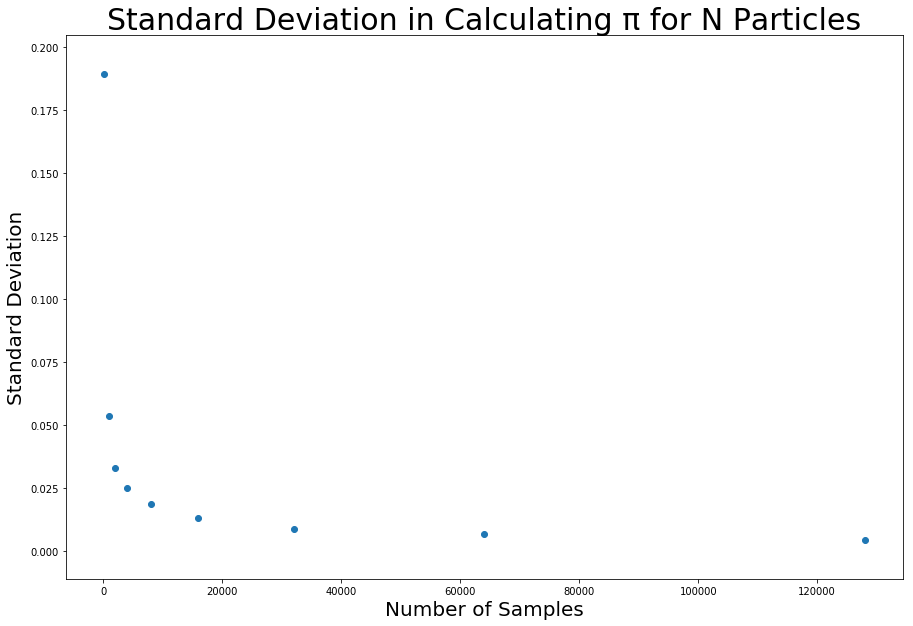

In [43]:
# Your answer to Question 1
# Your answer to Question 1
import numpy as np
import matplotlib.pyplot as plt
import math
from time import perf_counter


def in_circle(x, y):
    '''
    input: float, float
    output: bool
    
    The x and y coordinates of a point within a 2x2 grid is 
    given as input. If the position of this point falls 
    within the area of the circle of radius 1 centred in 
    this grid, then we return True otherwise False.
    '''
    
    # Check that input is valid
    if not isinstance(x, (int, float)) or not isinstance(y, (int, float)):
        return "x and y must be numerical values"
    
    
    # Calculate the size of its radial distance from the
    # origin.
    r = np.sqrt(x**2 + y**2)
    
    # If that radius is larger than the radius of the
    # circle then we return false, otherwise we return 
    # true.
    if r < 2.0 or math.isclose(r, 2.0, rel_tol=1e-10):
        return True
    else:
        return False

def measure_pi(N):
    '''
    input: int
    output: float
    
    We first sample N points from a 2x2 grid with equal 
    probability of being selected. We then check and keep
    count of each point which lies within the circle of 
    radius 2. From that count, we can establish our erzats
    value for pi by:
    
    4.0*(number of points in circle)/(number of points in square)
    '''
    
    # Check that we are receiving the correct input
    if not float(N).is_integer():
        return "N must be an integer"

    
    # Creating our array of samples from our 2x2 grid
    samples = 4.0 * np.random.ranf((N,2)) - 2.0

    # Initiating our count of points within the circle
    n_c = 0
    n_s = N
    
    # For each point in the samples array, we test
    # if it lies within the circle and increase our
    # count it it does.
    for point in samples: 
        if in_circle(point[0],point[1]):
            n_c+=1
            
    # We calculate our value of pi
    pi = 4.0*(n_c/n_s)
    
    return pi


#########################################################################
# Part a)
#########################################################################

# Initiating our timer 
ta_start = perf_counter()

# A list of the various values of N we want to calculate pi with
test_N = [100, 1000, 2000, 4000, 8000, 16000, 32000, 64000, 128000]

# For each value in test_N, we want to generate one calculation for
# pi and the difference between the calculated and real values
for N in test_N:
    
    calc_pi = measure_pi(N)
    dif = np.pi - calc_pi
    print('Pi calculated for N = {0}: {1} w/ difference of {2}'.format(N, calc_pi, dif))
    
# Stopping our timer
ta_stop = perf_counter() 

#########################################################################
# Part b)
#########################################################################

# Initiating our timer 
tb_start = perf_counter()

# We will be storing the various standard variations for each value of N
# into this list for plotting.
standard_deviations = []


for N in test_N:
    
    # For each value of N, we calculate the value of pi 100 times and
    # store it in result.
    result = np.zeros(100)
    for i in range(100):
        result[i] =  measure_pi(N)
        
    # Then we can let numpy take care of the mean and standard variations
    # for each set of 100 trials
    mean = np.mean(result)
    std  = np.std(result)
    
    # We output the mean and standard deviation for each value of N and 
    # append the standard deviation into our list: standard_deviations for
    # later on
    print('Mean π value for N = {0}: {1}  w/ standard deviation {2}'.format(N, mean, std))
    standard_deviations.append(std)


    
# Finally, we create a scatter plot of standard deviations as a function 
# of N and save as a .png
fig, ax = plt.subplots(figsize=(15.0, 10.0))
plt.xlabel("Number of Samples", fontsize=20)
plt.ylabel("Standard Deviation", fontsize=20)
plt.title("Standard Deviation in Calculating π for N Particles",fontsize=30)
plt.scatter(test_N, standard_deviations)    
plt.savefig('std_of_pi_values.png')
    
    
# Stopping our timer
tb_stop = perf_counter()


# We write the elapsed time results for a) and b) into runtimes.txt
result = open("runtimes.txt", "w")
result.write("Elapsed time during section a) in seconds:" + str(ta_stop-ta_start) + '\n')
result.write("Elapsed time during section b) in seconds:" + str(tb_stop-tb_start))
result.close()

---
# Question 2: Least Squares Fitting and the Photoelectric Effect
---

It's a common situation in physics that an experiment produces data that lies roughly on a straight line, like the dots in the figure below:

![line](leastsq_image.png)

The solid line here represents the underlying straight-line form, which we usually don't know, and the points representing the measured data lie roughly along the line but don't fall exactly on it, typically because of
measurement error.

The straight line can be represented in the familiar form $y=mx+c$ and a frequent question is what the appropriate values of the slope and intercept are that correspond to the measured data.  Since the data don't fall perfectly on a straight line, there is no perfect answer to such a question, but we can find the straight line that gives the best compromise fit to the data.  The standard technique for doing this is the method of least squares.

Suppose we make some guess about the parameters *m* and *c* for the straight line.  We then calculate the vertical distances between the data points and that line, as represented by the short vertical lines in the figure, then we calculate the sum of the squares of those distances, which we denote $\chi^2$.  If we have *N* data points with
coordinates $(x_i,y_i)$, then 

$\chi^2 = \sum\limits_{i=1}^N (mx_i+c-y_i)^2$

The least-squares fit of the straight line to the data is the straight line that minimizes this total squared distance from data to line.  We find the minimum by differentiating with respect to both *m* and *c* and setting the
derivatives to zero, which gives:

$m \sum\limits_{i=1}^N x_i^2 + c \sum\limits_{i=1}^N x_i - \sum_{i=1}^N x_iy_i = 0, $

$m \sum\limits_{i=1}^N x_i + cN - \sum\limits_{i=1}^N y_i = 0.$

For convenience, let us define the following quantities:

$E_x = {1\over N} \sum\limits_{i=1}^N x_i,\qquad$
$E_y = {1\over N} \sum\limits_{i=1}^N y_i,\qquad$
$E_{xx} = {1\over N} \sum\limits_{i=1}^N x_i^2,\qquad$
$E_{xy} = {1\over N} \sum\limits_{i=1}^N x_iy_i,$

in terms of which our equations can be written

$mE_{xx} + cE_x = E_{xy},$  
$mE_x + c = E_y.$

Solving these equations simultaneously for *m* and *c* now gives

$m = {E_{xy}-E_x E_y\over E_{xx} - E_x^2},\qquad$
$c = {E_{xx}E_y-E_x E_{xy}\over E_{xx} - E_x^2}.$

These are the equations for the least-squares fit of a straight line to *N* data points.  They tell you the values of *m* and *c* for the line that best fits the given data.

-------------------

The data in the file `frequencies_and_voltages.txt` are taken from an experiment performed by Robert Millikan that measured the photoelectric effect.  When light of a certain wavelength is shone on the surface of a metal, the photons in the light strike electrons in the metal and, sometimes, eject them from the surface.  The energy of an ejected electron is equal to the energy of the photon that struck it minus a small amount $\phi$, which is a property of the metal surface called the work function. 

The energy of a photon is $h\nu$, where $h$ is Planck's constant and $\nu$ is the frequency of the light, and we can measure the energy of an ejected electron by measuring the voltage $V$ that is just sufficient to stop the electron moving.  Then the voltage, frequency, and $\phi$ are related by the equation:
 
$V = {h\over e}\nu - \phi$,
 
where $e$ is the charge on the electron. This equation was first given by Albert Einstein in 1905. 

The data in the file `frequencies_and_voltages.txt` represent frequencies $\nu$ in
Hertz (first column) and voltages $V$ in volts (second column), as measured by Millikan in his 1916 experiment.

Reference: Here is Millikan's 1916 paper, for which he won the Nobel Prize:
https://journals.aps.org/pr/pdf/10.1103/PhysRev.7.355

He reported a measurement of Planck's constant (even though he was skeptical about the existance of photons at the time...). Here is his original diagram of the apparatus used to measure these values.

![Millikan](Millikans_expt.png)

Your program should do the following:
- Read in the data from the file `frequencies_and_voltages.txt`. Note, the first column in this file is the list of frequency values (in Hz) and the second column is the list of voltage values (in V).
- Fit a line to this data using the least squares method described above. Print the value of the slope and intercept that you obtain. Calculate the quantities $E_x$, $E_y$, $E_{xx}$, and $E_{xy}$ defined above, and from them calculate and print out the slope $m$ and intercept $c$ of the best-fit line. Now write code that goes through each of the data points in turn and evaluates the quantity $mx_i+c$ using the values of $m$ and $c$ that you calculated.  Store these values in a new array or list, and then graph this new array, as a solid line, on the same plot as the original data. You should end up with a plot of the data points plus a straight line that runs through them.
- Fit a line to this data using a function in the `scipy` library. Compare the results to your calculation using least squares fitting.
- Make a plot of the data together with the linear fit (including the equation of the line) on the same plot with a legend. Save this plot as a .png file.
- Using the equation above, and given that the charge on the electron is
$1.602\times10^{-19}\,$C, calculate from Millikan's experimental data a measured
value for Planck's constant.  Compare your value with the SI definition of Planck's constant, h,  $6.62607015\times10^{-34}\,$ $m^2 \cdot kg \cdot s^{-1}$.  Print the % error comparing the value you obtain from Millikan's data with the SI defined value of h. You'll see that Millikan's experiment was remarkably accurate given the limitations of his experimental setup (the metal surfaces he was using were likely oxidized; detector limitations).
- Round your results to three decimal places in all cases.
- Note: This calculation is essentially the same as the one that Millikan himself used to determine of the value of Planck's constant, although, lacking a computer, he fitted his straight line to the data by eye. 

[30 points]

Value of slope m = 4.088227358517502e-15 and intercept c = -1.73123580398135
Calculated h value: 6.549000000000001e-34 with percentage error: 1.163


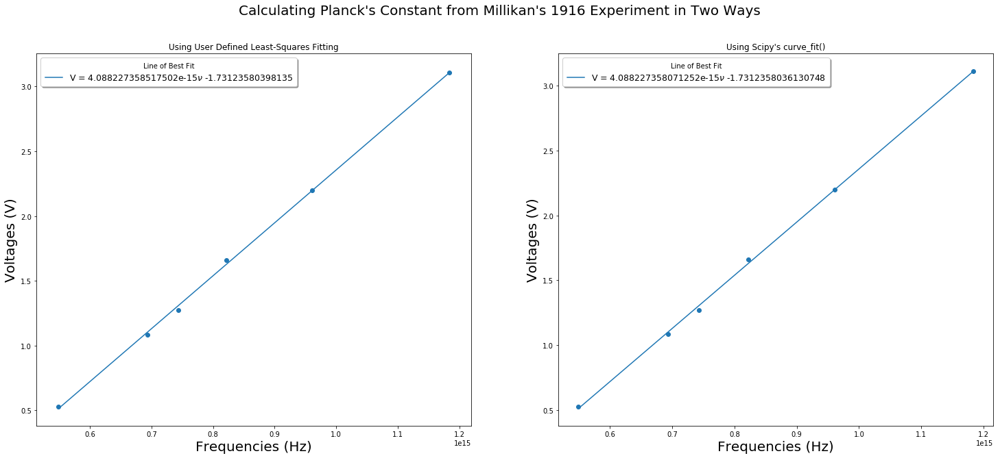

In [44]:
# Your answer to Question 2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import scipy
from scipy.optimize import curve_fit

def least_squares(x, y):
    '''
    input: numpy.array, numpy.array
    output: tuple(float, float)
    
    Calculates the line of best fit (of the form mx + c) using the 
    method of least squares. It takes in the data points represented 
    in the arrays x and y and intermediately calculates the values of
    E_x, E_xx, E_y, E_xy, prints them, and uses these values to 
    calculate m and c. These values are then returned as a tuple
    of the form (m,c).
    '''
    
   # Check that x and y are numpy arrays
    if not type(x) is np.ndarray or not type(y) is np.ndarray :
        return "x and y must be numpy arrays"
    
    # Check that x and y have the same size
    if x.size != y.size:
        return "x and y must have the same size"
    
    N = x.size
    
    # Calculate E_x, E_y, etc...
    E_x  = (1/N)*np.sum(x)
    E_y  = (1/N)*np.sum(y)
    E_xx = (1/N)*np.sum(np.square(x))
    E_xy = (1/N)*np.sum((x*y))
    
    # calculating slope and intercept, m and c
    m = (E_xy - (E_x*E_y))/(E_xx - (E_x**2))
    c = ((E_xx*E_y) - (E_x*E_xy))/(E_xx - (E_x**2))
    
    return (m,c)



# Reading data from text file
data = np.loadtxt("frequencies_and_voltages.txt",float)
frequencies = data[:,0]
voltages = data[:,1]

# Calculating line of best fit using user-defined least-squares
(m,c) = least_squares(frequencies, voltages)
print('Value of slope m = {0} and intercept c = {1}'.format(str(m), str(c)))
data_fitted = m*frequencies + c





# Plotting fitted line
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25.0, 10.0))
fig.suptitle("Calculating Planck's Constant from Millikan's 1916 Experiment in Two Ways", fontsize=20.0)

plt.subplot(121)
plt.plot(frequencies,data_fitted, label='V = ' + str(m) +  r'$\nu$' + ' ' + str(c) )
plt.scatter(frequencies, voltages)
plt.xlabel('Frequencies (Hz)', fontsize=20.0)
plt.ylabel('Voltages (V)', fontsize=20.0)
plt.legend(shadow=True,title='Line of Best Fit',fontsize=12.5,borderpad = 0.5) 
plt.title("Using User Defined Least-Squares Fitting")

#########################################################################
# Determining line of best fit with scipy.curve_fit

# Create the model function we want our fit to look like
def func(x, m, c):
     return (m * x) + c

# Calculating best m and c for the line of best fit and 
popt, pcov = curve_fit(func, frequencies, voltages)
x = np.linspace(int(frequencies.min()), int(frequencies.max()), 1000)
y = func(x, popt[0], popt[1])

plt.subplot(122)
plt.scatter(frequencies, voltages)
plt.plot(x, y, label='V = ' + str(popt[0]) +  r'$\nu$' + ' ' + str(popt[1]))
plt.xlabel('Frequencies (Hz)', fontsize=20.0)
plt.ylabel('Voltages (V)', fontsize=20.0)
plt.legend(shadow=True,title='Line of Best Fit',fontsize=12.5,borderpad = 0.5) 
plt.title("Using Scipy's curve_fit()")

plt.savefig('least_squares_fitting.png')



#########################################################################
# Calculating Planck's Constant

#  6.62607015×10−34
m_e = 1.602e-19
h = m * m_e
true_h = 6.62607015e-34

# Getting more than 37 digit precision. Should be 6.549e-34 but getting
# 6.549000000000001e-34
h = round(h, 37)
error = 100 * abs((h - true_h)/true_h)
print("Calculated h value: " + str(h) + " with percentage error: " + str(round(error, 3)))

---
# Numerical Error - Some Examples
---

In [45]:
# We'll be using numpy for these examples
import numpy as np

In [46]:
# The maximum & minimum numbers we can store in variables on the Jupyterhub
# The average error we can expect in an operation with floats

print( "maximum number: ",np.finfo(np.float64).max)
print( "minimum number: ", np.finfo(np.float64).min)
print( "epsilon: ", np.finfo(np.float64).eps)

maximum number:  1.7976931348623157e+308
minimum number:  -1.7976931348623157e+308
epsilon:  2.220446049250313e-16


In [47]:
# An example of overflow

big_number = 1.e308
print(big_number)
even_bigger_number = 10 * big_number
print(even_bigger_number)

1e+308
inf


In [48]:
# The constant, pi
print(np.pi)

3.141592653589793


In [49]:
# Example of a floating point number
# Note, values in scientific notation are floats
print(1.e-12)

1e-12


In [50]:
# Example of a subtraction error
print(1.e-15) # this is ok
print(1. + 1.e-15) # this is ok
print((1. + 1.e-15) -1.) # we would expect to get back 1e-15, but we don't 

1e-15
1.000000000000001
1.1102230246251565e-15


In [51]:
# Another example of a subtraction error
x = 1000000000000000
y = 1000000000000001.2345678901234
print(y - x)
error = abs(((1.2345678901234 - (y - x))/1.2345678901234)*100)
print("The error is ", round(error,1), "%.")

1.25
The error is  1.3 %.


In [52]:
.1 + .1 + .1 == .3 # Intuitively, we expect it to be true, but it is not. Don't test equality of floats!

False

In [53]:
# An example of a better way to test the equality of floats.

x = 3.29999999999999
epsilon = 1e-12
if abs(x - 3.3) < epsilon:
    print(x)

3.29999999999999


---
# Question 3: Accurately Calculating Roots of a Quadratic Equation
---
(a) Write a program that takes as input three numbers, $a$, $b$, and $c$, and prints out the two solutions to the quadratic equation
  $ax^2+bx+c=0$ using the standard formula

$x = {-b \pm \sqrt{b^2-4ac}\over2a}$.

Use your program to compute the solutions of $0.01 x^2 + 100 x + 0.01 =
0$.


(b) There is another way to write the solutions to a quadratic equation.
  Multiplying top and bottom of the solution above by
  $-b\mp\sqrt{b^2-4ac}$, the solutions can also be written as
 
$x = {2c\over-b\mp\sqrt{b^2-4ac}}$.
 
Add further lines to your program to print out these values in addition to
the earlier ones and again use the program to solve $0.01 x^2 + 100 x +
0.01 = 0$.  

(c) There are Python libraries that can be used to accurately find the roots of equations. SciPy has an extensive library of optimization tools. `fsolve` is a useful function for finding roots. `fsolve` takes two arguments. The first argument is a function (it can be a function that you define). The second argument is a point (or an array of points) at which `fsolve` begins searching for the roots. Refer to the documentation of `fsolve` for an example of how to use it: https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.fsolve.html Use `fsolve` to obtain the two roots. You can take these values to be the correct values for the roots. 

(d) Compare your results in part (a) and (b) with the roots found with `fsolve`. What do you notice about the accuracy of the roots in both cases? 

(e) Using what you have learned, write a new program that calculates both roots of a quadratic equation accurately in all cases.
 
This is a good example of how computers don't always work the way you expect them to.  If you simply apply the standard formula for the quadratic equation, the computer will sometimes get the wrong answer.  In practice
the method you have worked out here is the correct way to solve a quadratic equation on a computer, even though it's more complicated than the standard formula.  

[30 points]

In [54]:
# (a)
def quad_formula(a, b, c):
    '''
    input: float, float, float
    output: tuple(float, float)
    '''
    
    x_1 = (-b + np.sqrt(b**2 - 4*a*c))/(2*a)
    x_2 = (-b - np.sqrt(b**2 - 4*a*c))/(2*a)
    
    return (x_1, x_2)

print(quad_formula(0.01, 100, 0.01))
    

(-0.00010000000116860974, -9999.999899999999)


In [55]:
# (b) 
def quad_formula(a, b, c, alt_roots=False):
    '''
    input: float, float, float, bool
    output: tuple(float, float)
    '''
    if alt_roots == True:
        x_1 = (2*c)/(-b + np.sqrt(b**2 - 4*a*c))
        x_2 = (2*c)/(-b - np.sqrt(b**2 - 4*a*c))
    else:
        x_1 = (-b - np.sqrt(b**2 - 4*a*c))/(2*a)
        x_2 = (-b + np.sqrt(b**2 - 4*a*c))/(2*a)
    
    return (x_1, x_2)

# Original quadratic roots
print(quad_formula(0.01, 100, 0.01))

# Alternative quadratic roots
print(quad_formula(0.01, 100, 0.01, True))

(-9999.999899999999, -0.00010000000116860974)
(-9999.999883139028, -0.00010000000100000003)


In [56]:
import numpy as np
from scipy.optimize import fsolve
sqrt = np.emath.sqrt


def func(x):
    return 0.01*(x**2) + 100*x + 0.01


x, y = fsolve(func, (0.01, -10000))
x, y

(-0.00010000000098957712, -9999.999899999999)

In [57]:
# (d)
# By hand the roots to the quadratic should be -0.0001 and -10000. 
# However, because the function uses floating point precision
# python cannot resolve the root -9999.99989... towards the real 
# root of -10000. In the case of the second root, we are left 
# with all sorts of extraneous numbers after -0.0001. This applies
# to both the user defined quadratic roots solver and fsolve.

# This particular case involves a very large value for b and two 
# very small values for a and c relative to b. 

In [58]:
# (e)
def quad_formula2(a, b, c):
    '''
    input: float, float, float
    output: tuple(float, float)
    
    '''
    
    # We gain precision in the case of b=0 by skipping over
    # any superfluous calculations that might affect the 
    # final precision
    
    if b == 0:
        x_1 =  np.sqrt(c/a)
        x_2 = -np.sqrt(c/a)
        
        return (x_1,x_2)
        
    # Check if the percentage error of the discriminant compared
    # to b is small enough to calculate quadratic roots normally
    percentage_error = abs((np.sqrt(b**2 - 4*a*c) - b)/b)*100    
    
    # If not, we use the alternative roots as suggested
    if(percentage_error > 1):
        x_1 = (2*c)/(-b + np.sqrt(b**2 - 4*a*c))
        x_2 = (2*c)/(-b - np.sqrt(b**2 - 4*a*c))
       
    # Otherwise calculate like usual
    else:
        x_1 = (-b - np.sqrt(b**2 - 4*a*c))/(2*a)
        x_2 = (-b + np.sqrt(b**2 - 4*a*c))/(2*a)
        
    
    
    return (x_1, x_2)

print(quad_formula2(1, 0, 4))
print(quad_formula2(0.01, 100, 0.01))
print(quad_formula2(2, 4, -6))

(2.0, -2.0)
(-9999.999899999999, -0.00010000000116860974)
(-3.0, 1.0)


---
# Question 4: Calculating Integrals
---

Suppose we want to calculate the value of the integral

$I = \int_{-1}^1 \sqrt{1-x^2} \> dx$

The integrand looks like a semicircle of radius 1:
![semicircle](semicircle.png)

and hence the value of the integral---the area under the
curve---must be $1/2 \pi=1.57079632679\ldots$

Alternatively, we can evaluate the integral on the computer by dividing the
domain of integration into a large number $N$ of slices of width $h=2/N$
each and then using the Riemann definition of the integral:

$I = \lim_{N\to\infty} \sum\limits_{k=1}^N hy_k\ \qquad$

where

$y_k = \sqrt{1 - x_k^2}\qquad\mbox{and}\qquad$
$x_k = -1 + hk$.

We cannot in practice take the limit $N\to\infty$, but we can make a
reasonable approximation by just making $N$ large.

- Write a program to evaluate the integral above with $N=100$ and
  compare the result with the exact value.  The two will not agree very
  well, because $N=100$ is not a sufficiently large number of slices.
- Increase the value of $N$ to get a more accurate value for the
  integral.  If we require that the program runs in about one second or
  less, how accurate a value can you get?

Evaluating integrals is a common task in computational physics
calculations.  We will study techniques for doing integrals in detail in
the next lecture.  As we will see, there are substantially quicker and more
accurate methods than the simple one we have used here.

[20 points]

In [59]:
# Your answer to Question 4
import numpy as np
import matplotlib.pyplot as plt
from time import perf_counter
    
# Define the Riemann Sum for the above function
def Riemann_sum(N):
    '''
    input: int
    output: float
    
    For a domain of (-1, 1) the function calculates the Riemann
    sum for the function y(x) = √(1 - x^2) by splitting the domain into
    N equal slices and calculating y(x) at the upper end of each slice.
    '''
    
    # Check that we are receiving the correct input
    if not float(N).is_integer():
        return "N must be an integer"
    
    
    # Construct the domain of (-1,1) with N divisions
    x = np.linspace(-1, 1, N)
    
    # calculate y for each slice
    y_k =  (1 - x**2)**(1/2)
    
    # Set up our calculation for the integral, I
    I = 0
    
    # Add the area of each slice by y*(2/N)
    for y in y_k:
        I += y*(2/N)
    
    return I

t_start = perf_counter()
I = 1.57079632679
I_1 = Riemann_sum(100)
I_2 = Riemann_sum(1000000)
t_stop = perf_counter()

print("Riemann Sum Integral for N = 100: ", I_1, " Difference with real value: ", I-I_1)
print("Riemann Sum Integral for N = 1000000: ", I_2, " Difference with real value: ", I-I_2 )
print("Real Value of Integral: ", I)
print("Elapsed time in seconds:" + str(t_stop-t_start) + '\n')

Riemann Sum Integral for N = 100:  1.5534179294048955  Difference with real value:  0.017378397385104494
Riemann Sum Integral for N = 1000000:  1.5707947543355443  Difference with real value:  1.572454455756045e-06
Real Value of Integral:  1.57079632679
Elapsed time in seconds:0.38665690273046494



---
# **Question 5: Data Visualization**
---

Using what you've learned so far in the course, create a plot or animation of a data set (it can be physical data but it doesn't have to be). Make sure to go beyond default `matplotlib` settings to make a clear, visually appealing graphical representation of your chosen data set. Keep in mind the "10 Simple Rules for Figures" paper. You might find the `seaborn` library useful for plotting scientific figures.

There's an excellent library of tutorials here: https://seaborn.pydata.org/tutorial.html

[20 points]

/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)





Found 300 files of the format *_movie.jpg.

Making HTML code for displaying 000_movie.jpg, 001_movie.jpg, 002_movie.jpg, 003_movie.jpg, 004_movie.jpg, 005_movie.jpg, 006_movie.jpg, 007_movie.jpg, 008_movie.jpg, 009_movie.jpg, 010_movie.jpg, 011_movie.jpg, 012_movie.jpg, 013_movie.jpg, 014_movie.jpg, 015_movie.jpg, 016_movie.jpg, 017_movie.jpg, 018_movie.jpg, 019_movie.jpg, 020_movie.jpg, 021_movie.jpg, 022_movie.jpg, 023_movie.jpg, 024_movie.jpg, 025_movie.jpg, 026_movie.jpg, 027_movie.jpg, 028_movie.jpg, 029_movie.jpg, 030_movie.jpg, 031_movie.jpg, 032_movie.jpg, 033_movie.jpg, 034_movie.jpg, 035_movie.jpg, 036_movie.jpg, 037_movie.jpg, 038_movie.jpg, 039_movie.jpg, 040_movie.jpg, 041_movie.jpg, 042_movie.jpg, 043_movie.jpg, 044_movie.jpg, 045_movie.jpg, 046_movie.jpg, 047_movie.jpg, 048_movie.jpg, 049_movie.jpg, 050_movie.jpg, 051_movie.jpg, 052_movie.jpg, 053_movie.jpg, 054_movie.jpg, 055_movie.jpg, 056_movie.jpg, 057_movie.jpg, 058_movie.jpg, 059_movie.jpg, 060_movie.jpg, 061_mo

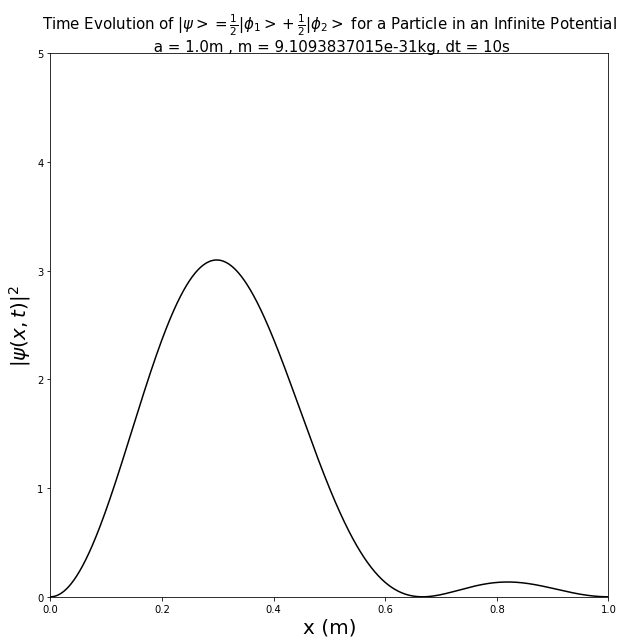

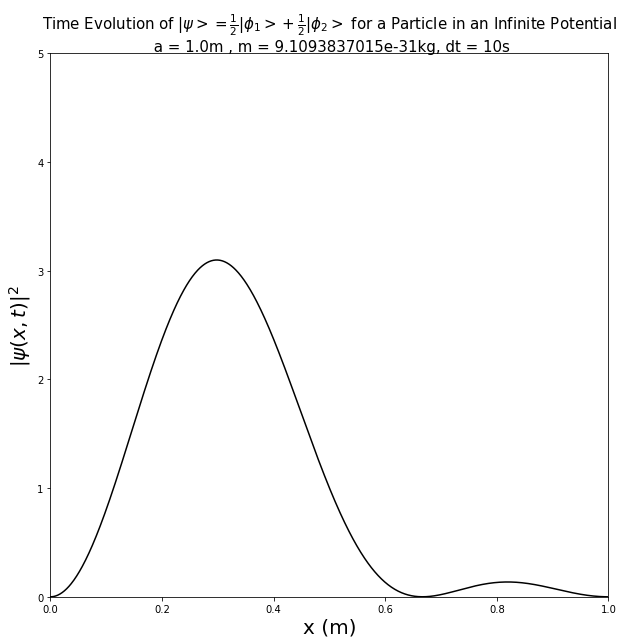

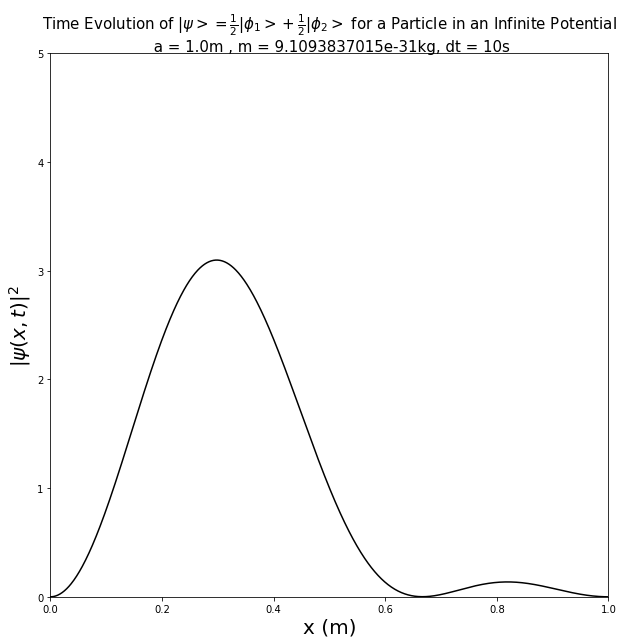

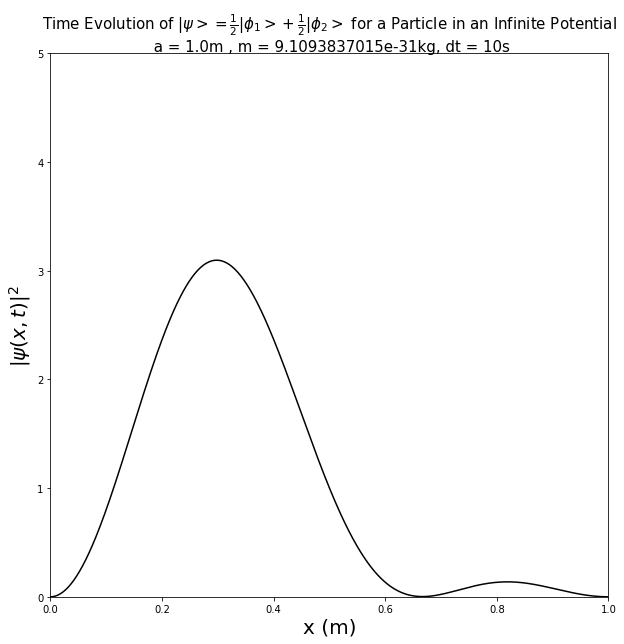

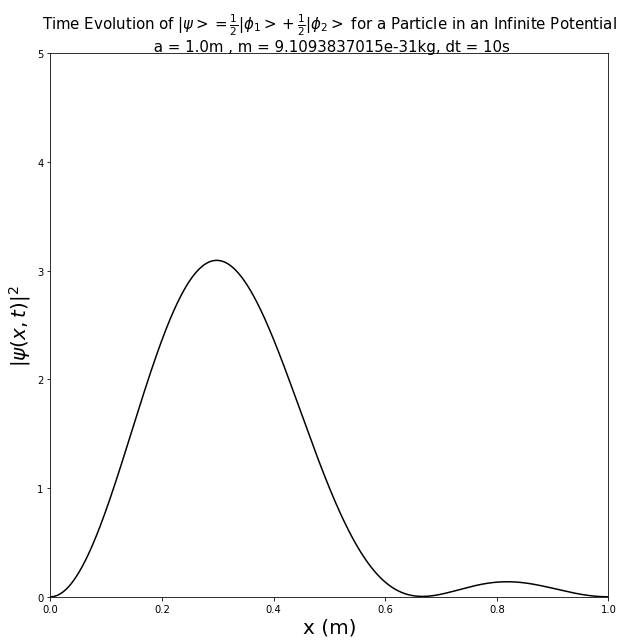

...

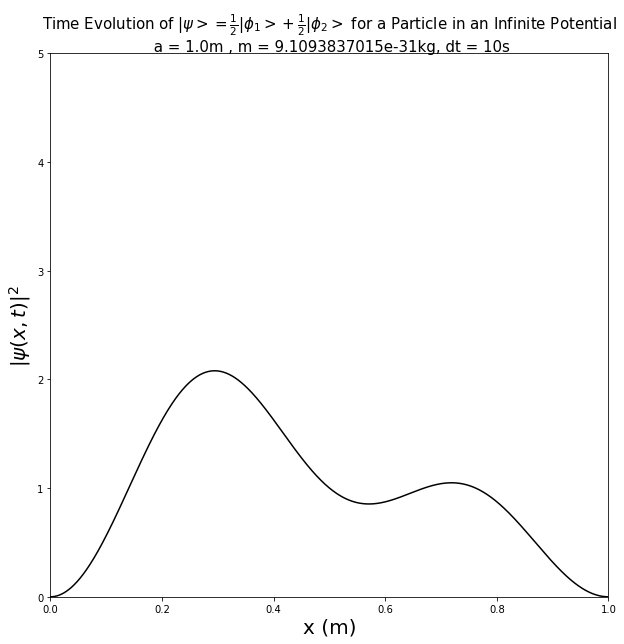

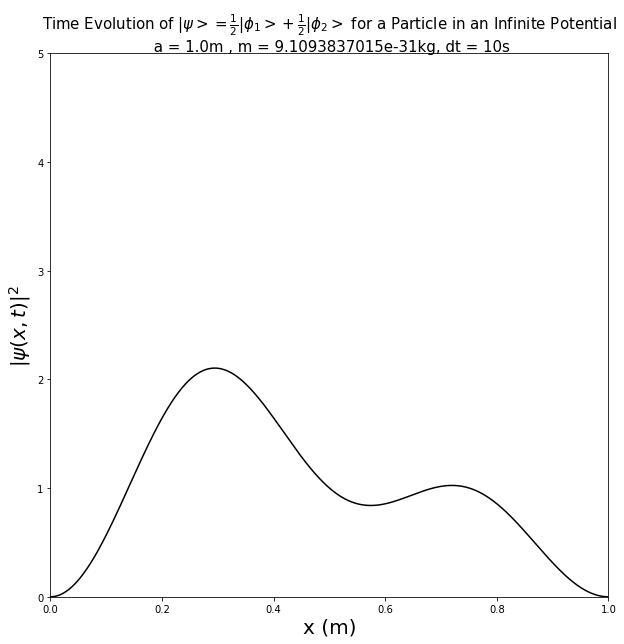

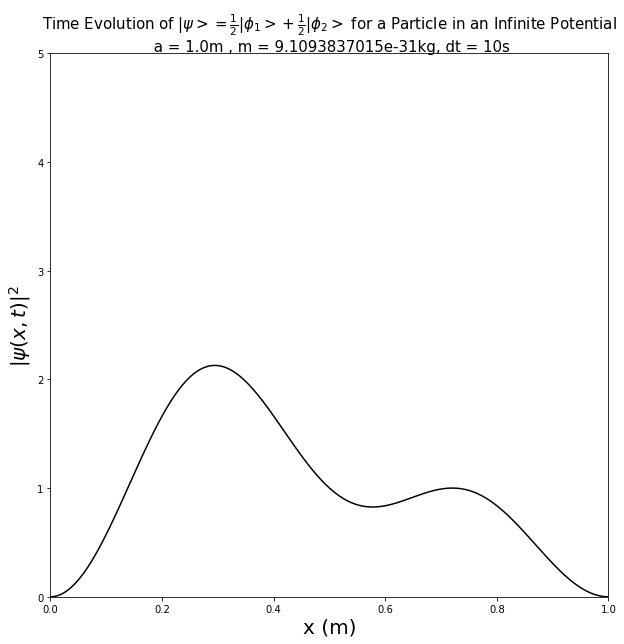

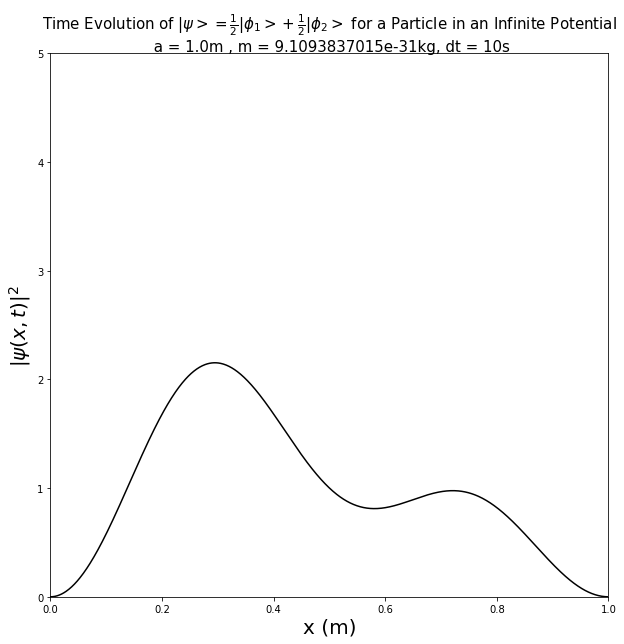

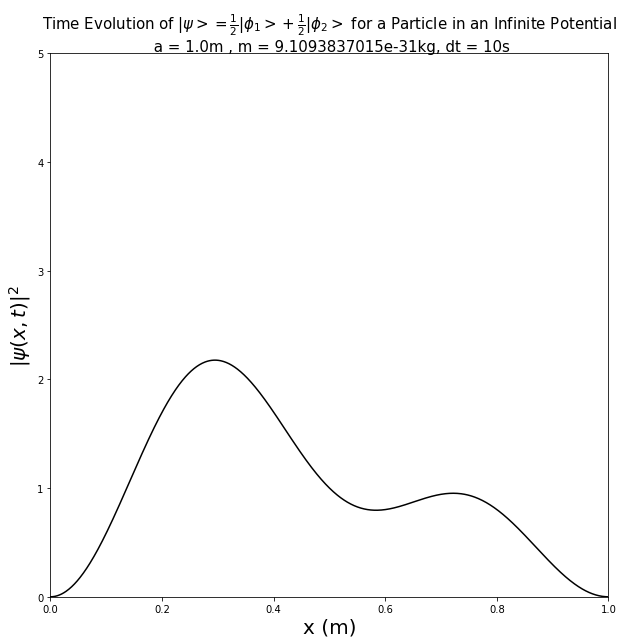

In [61]:
# Your answer to Question 5
import numpy as np
import matplotlib.pyplot as plt
import scipy.constants as constants
from html_movie import movie
import math
from time import perf_counter 

#####################################################################################
# The following discussion refers to the time evolution of a particle in an infinite
# potential well as discussed in Cohen-Tannoudji Complement A_III. A particle in its
# initial state, |psi(t=0)> is represented by the linear combination of eigenkets 
# |phi_1> and |phi_2> . From (D-54) of chapter III of Cohen-Tannoudji we can 
# describe the time evolution of the wavefunction by multiplying each eigenstate
# by a complex exponential with the time t and the respective energy eigenavalue
# in the exponent. With |psi > = 1/sqrt(2)[|phi_1> + |phi_2>] when we calculate
# the time evolution of its probability density, we have:
#
# |psi(x, t)|^2 = 1/2(phi_1(x))^2 + 1/2(phi_2(x))^2 + phi_1(x)phi_2(x)cos(w_21*t)
#
# where w_21 is given by w_21 = (3*pi^2*h_bar)/(2*m*a^2) where a is the length of the 
# well and m is the mass of the particle in question
#####################################################################################

# Initiating our timer 
t1_start = perf_counter()  

# Mass of an electron within an infinite potential well
# Declaring our position space in increments of (a/1000)m
m = constants.m_e
a = 1.0 
x = np.arange(0, a, a/1000)

# Eigenstates phi_1 and phi_2
phi_1 = math.sqrt(2/a)*np.sin((np.pi/a)*x)
phi_2 = math.sqrt(2/a)*np.sin(((2*np.pi)/a)*x)

# Angular frequency of cross term responsible for the
# time evolution of the shape of the wave packet
w_21 = (3*constants.hbar*(np.pi)**2)/(2*m*(a)**2)

# Setting up our time range in increments of dt
dt = 10
t_total = 3000
t = np.arange(0, t_total, dt)

# This defines the file names for the frames of the movie.
# The frames are numbered in order starting with 000
# {:03d} will display integers with three digits and insert zeros if needed:
# '000_movie.jpg', '001_movie.jpg', etc.
# if you need to have more frames in your movie, you will need to modify this line
file_name = "{:03d}_movie.jpg"


for i in range(t.size):
    
    # Our Probability distribution for the time evolution of the wave
    # packet
    prob_dist = 0.5*(phi_1)**2 + 0.5*(phi_2)**2 + phi_1*phi_2*np.cos(w_21*t[i])
    
    # Create a plot of the particle's position up to the current time with title, axes labels
    fig, ax = plt.subplots(figsize=(10.0, 10.0))
    plt.clf()
    
    plt.plot(x, prob_dist, c="k")
    plt.ylabel(r'$\|\psi(x,t)|^{2}$', fontsize=20.0)
    plt.xlabel('x (m)', fontsize=20.0)

    # We set the limits of this plot so all of the points will be displayed (so the axes don't change
    # during the movie)
    plt.xlim(0.0, a)
    plt.ylim(0.0, 5)
    
    # Add a title to the plot
    plt.title('Time Evolution of ' + r'$\|\psi > = \frac{1}{2}|\phi_{1} > + \frac{1}{2}|\phi_{2} >$' 
              + ' for a Particle in an Infinite Potential' +
              '\n a = {0}m , m = {1}kg, dt = {2}s'.format(str(a), str(m), str(dt)), fontsize=15.0)
    
    # Save the file in the format given above -- number followed by _movie.jpg
    plt.savefig(file_name.format(i)) 

# Use html movie encoder from scitools to create an HTML document that
# will display the frames as a movie. 
# You will be able to open the file movie.html in a Web browser to view it. 
# Use the controls to start the movie.
movie(input_files='*_movie.jpg', output_file='infinitepotentialwell.html')

# Stopping our timer
t1_stop = perf_counter() 

# Displaying performance stats
print("Elapsed time during the whole program in seconds:", 
                                        t1_stop-t1_start) 
